# Import Libraries and Load Data

In [1]:
# import custom functions for joins and cleaning strings
import custom_functions.clean_strings as cs
import custom_functions.joins as j

# main libs
import geopandas

# plotting
import matplotlib.pyplot as plt

# reading and manipulating data
import pandas as pd

# for nice output statements, such as with `print()`:
from rich.console import Console

%matplotlib inline

console = Console()

Let's import the data. `geopandas.GeoDataFrame` can have as many `geopandas.GeoSeries` objects within, but only one is active at a time.

In [2]:
# load stalls lon-lat table
bikemi_stalls = geopandas.read_file("../data/bikemi_metadata/bikemi_stalls.geojson")

# load NIL lon-lat table
nil = geopandas.read_file("../data/milan/milan_nil.geojson")

# actually not needed, municipi categorical var is already in bikemi_stalls
municipi = geopandas.read_file("../data/milan/milan_municipi.geojson")

In [3]:
# select only the column we need + rename
nil = (
    nil[["ID_NIL", "NIL", "geometry"]]
    .assign(NIL=lambda x: x["NIL"].str.title())
    .astype({"ID_NIL": "string", "NIL": "string"})
    .rename(columns={"NIL": "nil", "ID_NIL": "nil_number"})
    .set_index("nil_number")
    .sort_values("nil", ascending=True)
)

nil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 88 entries, 17 to 26
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   nil       88 non-null     string  
 1   geometry  88 non-null     geometry
dtypes: geometry(1), string(1)
memory usage: 2.1+ KB


In [4]:
# select only the column we need + rename
bikemi_stalls = (
    bikemi_stalls[["nome", "zd_attuale", "geometry", "anno"]]
    .rename(columns={"zd_attuale": "municipio"})
    .sort_values(by=["nome"], ascending=True)
    .astype({"nome": "string", "municipio": "string"})
    .set_index("nome")
)

bikemi_stalls.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 319 entries, Accursio - Portello to Zavattari - Tempesta
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   municipio  319 non-null    string  
 1   geometry   319 non-null    geometry
 2   anno       317 non-null    float64 
dtypes: float64(1), geometry(1), string(1)
memory usage: 10.0+ KB


We have geometries. Let's make a first plot, to see how it looks like.

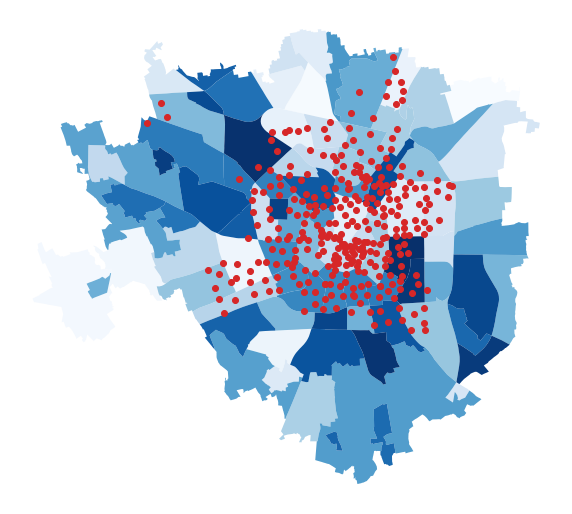

In [5]:
# define ax object and dimensions
fig, ax = plt.subplots(figsize=(10, 10))

# plot both objects on the same axes; order matters
nil.plot(ax=ax, cmap="Blues")
bikemi_stalls.plot(ax=ax, color="tab:red")

# remove the axis lines
plt.axis("off")
plt.show()

Finally, let's load the time series data:

In [6]:
# load the time series for each station in the long format
station_outflow = pd.read_csv(
    "../data/bikemi_csv/station_daily_outflow.csv",
    parse_dates=[0],
    index_col=[0],
    dtype={"stazione_partenza": "string"},
)

station_outflow.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 104589 entries, 2019-12-31 to 2019-01-01
Data columns (total 2 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   stazione_partenza  104589 non-null  string
 1   count              104589 non-null  int64 
dtypes: int64(1), string(1)
memory usage: 2.4 MB


# First Join: BikeMi Stalls and Time Series Data

## Tentative Join

In [7]:
# join the index of the table specified as the first argument on the column specified by the "on" argument
tentative_join = geopandas.GeoDataFrame(
    # the data to pass as first argument:
    station_outflow.join(bikemi_stalls, on="stazione_partenza").sort_values(
        ["giorno_partenza", "stazione_partenza"], ascending=True
    ),
    # then set the coordinate reference system
    crs="EPSG:4326",
).astype({"stazione_partenza": "string"})

tentative_join.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
DatetimeIndex: 104589 entries, 2019-01-01 to 2019-12-31
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   stazione_partenza  104589 non-null  string  
 1   count              104589 non-null  int64   
 2   municipio          91458 non-null   string  
 3   geometry           91458 non-null   geometry
 4   anno               91098 non-null   float64 
dtypes: float64(1), geometry(1), int64(1), string(2)
memory usage: 4.8 MB


Some information is actually lost! There are some observations from the dataset which cannot be matched to the stalls list.

In [8]:
unique_stalls = pd.Series(bikemi_stalls.index.unique())
unique_stations = pd.Series(
    station_outflow["stazione_partenza"].sort_values(ascending=True).unique(),
    name="stazione_partenza",
)

# using rich
console.print(
    f"""
Number of stalls in the official data: {unique_stalls.size}.
Number of stalls in our time series: {unique_stations.size}.
"""
)

Number of stalls in the official data: 319.
Number of stalls in our time series: 306.

## String Matching

13 stalls are missing, but we are likely to find more mismatches. To deal with this, we have to turn to snake_case all station names, then perform the join again. We will have to use regular expressions. As Jamie Zawinski said in 1997:

> Some people, when confronted with a problem, think: "I know, I'll use regular expressions". Now they have two problems.

Here we apply some custom functions, which can be found in the omonimous folder under this directory.

In [9]:
clean_stalls = cs.clean_series(unique_stalls)
clean_stations = cs.clean_series(unique_stations)

j.mismatches(clean_stalls, clean_stations, left_on="nome", right_on="stazione_partenza")
mismatched_stations, mismatched_stalls = j.mismatches(
    clean_stalls,
    clean_stations,
    left_on="nome",
    right_on="stazione_partenza",
    text=False,
)


        1 stations are only in the time series data.
        14 stalls are only in the stalls data.
        


In [10]:
list(mismatched_stalls), list(mismatched_stations)

(['brunelleschi_giambellino',
  'cascina_merlata_social_village',
  'cascina_merlata_uptown',
  'ciclamini_palazzetto_del_ghiaccio',
  'fezzan_forli',
  'giambellino_odazio',
  'gioia_vespucci',
  'inganni_corba',
  'inganni_lorenteggio',
  'passerini_belloveso',
  'san_giminiano_solderini',
  'tirana_san_cristoforo',
  'tolstoi_lorenteggio',
  'velasquez_osoppo'],
 ['santagostino'])

Some stations do not appear because they were introduced in 2020 and 2021, i.e. `Brunelleschi - Giambellino`. Others, such as `Gioia - Vespucci`, do not have a value for `anno`.

In [11]:
# take some time to appreciate how clean df.query() is:
bikemi_stalls.query("anno >= 2020 or anno.isna()")

,municipio,geometry,anno
nome,,,
Brunelleschi - Giambellino,6,POINT (9.14443 45.44904),2020.0
Cascina Merlata - Social Village,8,POINT (9.10079 45.51169),2021.0
Cascina Merlata - UpTown,8,POINT (9.10345 45.50711),2021.0
Ciclamini - Palazzetto del Ghiaccio,6,POINT (9.12796 45.45558),2020.0
Fezzan - Forli',6,POINT (9.14623 45.45963),2020.0
Giambellino - Odazio,6,POINT (9.13521 45.44717),2020.0
Gioia - Vespucci,9,POINT (9.19167 45.48139),NaN
Inganni - Corba,6,POINT (9.12592 45.45103),2020.0
Inganni - Lorenteggio,6,POINT (9.12791 45.44736),2020.0


This is another reason for aggregating the data to the NIL level: stations may change across this time span, whereas NIL stay the same for 10 years at least.

Now we can retry the join, after applying the custom function for cleaning strings to each column we plan to join.

## Cleaned Data

In [12]:
clean_outflow = cs.clean_df(station_outflow, col="stazione_partenza", inplace=True)
clean_bikemi_stalls = cs.clean_df(
    bikemi_stalls.drop("anno", axis=1).reset_index(), col="nome", inplace=True
).set_index("nome")

In [14]:
geo_outflow = geopandas.GeoDataFrame(
    clean_outflow.join(clean_bikemi_stalls, on="stazione_partenza").iloc[::-1],
    crs="EPSG:4326",
).astype({"stazione_partenza": "string"})

geo_outflow.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
DatetimeIndex: 104589 entries, 2019-01-01 to 2019-12-31
Data columns (total 4 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   stazione_partenza  104589 non-null  string  
 1   count              104589 non-null  int64   
 2   municipio          104379 non-null  string  
 3   geometry           104379 non-null  geometry
dtypes: geometry(1), int64(1), string(2)
memory usage: 4.0 MB


Notice that we lose just a small part of the observations. Now it's finally time to perform the spatial joins to obtain the NIL from this data:

# Two Spatial Joins

Let's proceed with a spatial operation, to assign each stall to its NIL, i.e. neighbourhood. The spatial operations can be:

* `intersects`: if the object on the left is inside or on the boundary of the object on the right.
* `contains`: if the object on the left contains the one on the right (i.e. no part of right is outside of left).
* `within`: the opposite of `contains`.
* `touches`: if boundaries touch in at least one point, but none in the interior.
* `crosses`: more than one but not all points in common.
* `overlaps`: same as above, but the objects have the same dimension and yet do not coincide (see it as equivalence vs congruence).

## Second Spatial Join: Georeferenced Time Series and Local Neighbourhoods (NIL)

In [17]:
geo_outflow_nil = (
    geopandas.sjoin(geo_outflow, nil, how="inner", op="intersects")
    .rename(
        columns={
            "geometry": "nil_geometry",
            "index_right": "nil_number",
            "nil": "nil_name",
        }
    )
    .set_geometry("nil_geometry")
    .astype(
        {
            "stazione_partenza": "string",
            "municipio": "string",
            "nil_number": "string",
            "nil_name": "string",
        }
    )
)

geo_outflow_nil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
DatetimeIndex: 104379 entries, 2019-01-01 to 2019-12-31
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   stazione_partenza  104379 non-null  string  
 1   count              104379 non-null  int64   
 2   municipio          104379 non-null  string  
 3   nil_geometry       104379 non-null  geometry
 4   nil_number         104379 non-null  string  
 5   nil_name           104379 non-null  string  
dtypes: geometry(1), int64(1), string(4)
memory usage: 5.6 MB


In [18]:
geo_outflow_nil.head()

,stazione_partenza,count,municipio,nil_geometry,nil_number,nil_name
giorno_partenza,,,,,,
2019-01-01,accursio_portello,2,8,POINT (9.14589 45.49091),71,Villapizzone - Cagnola - Boldinasco
2019-01-01,mac_mahon_artieri,2,8,POINT (9.15498 45.49588),71,Villapizzone - Cagnola - Boldinasco
2019-01-02,accursio_portello,10,8,POINT (9.14589 45.49091),71,Villapizzone - Cagnola - Boldinasco
2019-01-02,castelli_ailanti,2,8,POINT (9.15210 45.49945),71,Villapizzone - Cagnola - Boldinasco
2019-01-02,mac_mahon_artieri,6,8,POINT (9.15498 45.49588),71,Villapizzone - Cagnola - Boldinasco


Let's see how many NILs actually end up in the data:

In [19]:
pd.DataFrame(geo_outflow_nil.nil_name.unique())

,0
0,Villapizzone - Cagnola - Boldinasco
1,Scalo Romana
2,Isola
3,De Angeli - Monte Rosa
4,Lodi - Corvetto
5,Porta Magenta
6,Bicocca
7,Duomo
8,Parco Sempione
9,Porta Ticinese - Conchetta


Basically, there are bikemi stations in only half of the NILs in Milan. ~~However, this operations disregards the null values by default. For example, let's `groupby()` NIL and count the number of rows, and see what the last values of this new `DataFrame` look like:~~ This will only occur if the `dtype` of `stazione_partenza` is `category`.

In [21]:
geo_outflow_nil.groupby("nil_name")["stazione_partenza"].count().sort_values(
    ascending=False
).reset_index()

,nil_name,stazione_partenza
0,Duomo,12288
1,Buenos Aires - Porta Venezia - Porta Monforte,7934
2,Guastalla,4698
3,Brera,4462
4,Stazione Centrale - Ponte Seveso,4338
5,Porta Ticinese - Conca Del Naviglio,3619
6,Porta Vigentina - Porta Lodovica,3601
7,Porta Garibaldi - Porta Nuova,3591
8,Isola,3582
9,Citta' Studi,3443


From this view, we see that some NILs report less than 365 observations, i.e. the nieghbourhood likely includes only one station with many zeroes. These are indeed the neighbourhoods at the outer skirts of Milan and display a small number of observations because there is a small number of stations and other means of transportations are much more used.

To obtain a better view, we want to build a table with NILs and the number of stations inside each one. There are two ways of going about this:

1. Perform a spatial join from the NIL table and the Station Table.
2. Perform some convoluted operations on our data.

The end goal of this would be to come up with a list of all neighbourhoods where the number of stations is adequate for our analysis (say, greater than 5).

Each approach has its pros and cons. The first requires going back on our code and might be more straight forward, whereas the second is more direct but requires a `groupby` followed by an assignment with a double `lambda` function. As of now, we shall go with the second approach, which we discuss in the following paragraph.

### `groubpy` and Double Lambda Function

To obtain this table, we need to `groupby()` the data by `nil_name` and apply the `unique()` method to list all unique `stazione_partenza` in each NIL. This is necessary because if we were to simply apply `count()` or `size()` we would get the number of rows for each neighbourhoord. This on itself would be enough to give us a feel of how many stations there are in each NIL, but will not be straight-forward to use to decide which neighbourhoods to keep in.

```python
pd.DataFrame(geo_outflow_nil.reset_index().groupby("nil_name")["stazione_partenza"].unique())
```

The resulting `DataFrame` has a two columns: the name of the neighbourhood, plus a list of the stations inside it. We need to craft a lambda to count the number of stations and then assign these values to a new column for the table. This is why we cast the `groupby()` output as a `pd.DataFrame` - otherwise we would not be able to use the method `.assign()`. Unfortunately, using this method entails using a double `lambda`. The first `lambda` is needed to perform the assignment: `[...].assign(count = lambda x: x["stazione_partenza"]`. The second one is used inside the `apply()` method to retrieve the length of the list on each row.

This double `lambda` can be avoided by using a more primitive approach, i.e. by defining a variable to store the `groupby()` - say, `df` - and then creating a new column for this `df` in the following way:

```python
df["count"] = df["stazione_partenza"].apply(lambda x: len(x))
```

I am not a fan of this way of writing `pandas` code. It needlessly creates useless variables and makes the code more difficult to come back to. Instead, using `assign` is more readable and can be used at any point during transformations, thanks to method chaining. This is more esthetically pleasing and reminds me of the `tidyverse`, whose influence cannot be overstated. After all, even `pandas` provides methods to enforce a sort of `{dplyr}` syntax: `query()`, `assign()` and `flter()` are equivalents of `dplyr::filter()`, `dplyr::mutate()` and `dplyr::select()`.

Putting the two together, we get the following line of code:

In [23]:
nils_and_stations = (
    pd.DataFrame(
        geo_outflow_nil.reset_index().groupby("nil_name")["stazione_partenza"].unique()
    )
    .reset_index()
    .assign(count=lambda x: x["stazione_partenza"].apply(lambda x: len(x)))
    .sort_values("count")
)

nils_and_stations

,nil_name,stazione_partenza,count
23,Ortomercato,[cuoco_monte_cimone],1
35,Qt 8,[qt8_isernia],1
34,Q.Re Gallaratese - Q.Re San Leonardo - Lampugnano,[molino_dorino_m1],1
11,Giambellino,[savona_tolstoj],1
21,Morivione,"[de_angeli_ripamonti, spadolini_centro_leoni]",2
17,Lorenteggio,"[inganni_m1_zurigo, primaticcio_corba, primati...",3
40,Villapizzone - Cagnola - Boldinasco,"[accursio_portello, mac_mahon_artieri, castell...",3
39,Umbria - Molise - Calvairate,"[insubria_bruno, tertulliano_caroncini, ciceri...",3
13,Greco - Segnano,"[de_marchi_bottelli, gioia_cassina_de_pomm, de...",3
7,Dergano,"[dergano, imbonati_dergano_m3, livigno_monte_s...",3


To obtain a better view of this table, we can plot it:

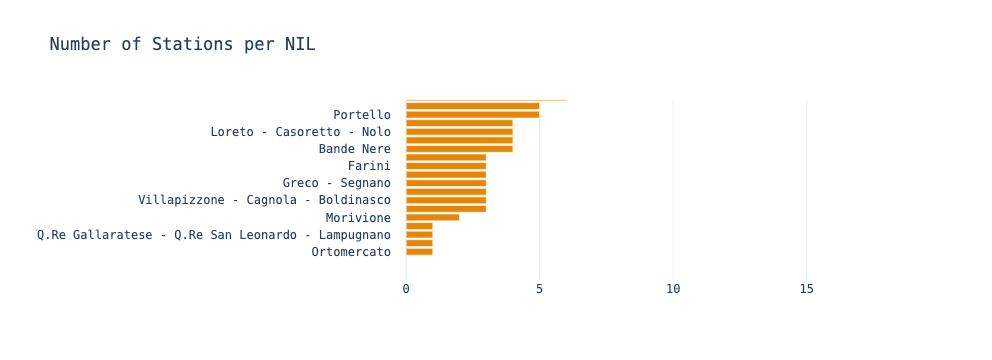

In [24]:
# setting up plotly:
import plotly.express as px

pd.options.plotting.backend = "plotly"

nils_and_stations.plot(
    x="count",
    y="nil_name",
    kind="barh",
    title="Number of Stations per NIL",
    labels=dict(count="", nil_name=""),
    color_discrete_sequence=px.colors.qualitative.Vivid,
).update_layout({"template": "plotly_white", "font_family": "DejaVuSansMono Nerd Font"})

We could decide to take out all NILs with less than, say, 4 stations (included), but this would feel a bit arbitrary. Let us plot the correlation matrix, to get a better picture. First, we need to aggregate the data:

In [42]:
nil_daily_rentals = (
    geo_outflow_nil.reset_index()
    .groupby(["nil_name", "giorno_partenza"], as_index=False)["count"]
    .sum()
    .sort_values(by=["giorno_partenza", "nil_name"])
    .set_index("giorno_partenza")
    .pivot(columns="nil_name", values="count")
    .fillna(0)
    .astype("int64")
)

nil_daily_rentals

nil_name,Bande Nere,Bicocca,Bovisa,Brera,Buenos Aires - Porta Venezia - Porta Monforte,Citta' Studi,De Angeli - Monte Rosa,Dergano,Duomo,Farini,...,Portello,Pta Romana,Q.Re Gallaratese - Q.Re San Leonardo - Lampugnano,Qt 8,Sarpi,Scalo Romana,Stazione Centrale - Ponte Seveso,Umbria - Molise - Calvairate,Villapizzone - Cagnola - Boldinasco,Xxii Marzo
giorno_partenza,,,,,,,,,,,,,,,,,,,,,
2019-01-01,0,4,6,54,74,44,17,7,99,2,...,14,17,0,1,43,1,57,0,4,25
2019-01-02,0,23,24,237,300,105,54,23,545,31,...,43,90,1,4,123,21,233,0,18,93
2019-01-03,0,26,26,276,340,116,62,22,601,31,...,40,107,0,2,178,16,225,0,28,107
2019-01-04,0,27,31,294,362,129,61,25,633,31,...,48,93,0,4,193,19,211,0,19,103
2019-01-05,0,10,17,175,355,96,39,17,416,23,...,41,85,0,0,173,11,110,0,20,86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,5,11,8,218,279,79,54,10,445,17,...,35,75,1,4,162,15,137,13,25,82
2019-12-28,6,8,5,140,194,55,44,6,285,13,...,25,47,0,2,110,10,97,12,25,56
2019-12-29,5,6,4,73,129,36,30,6,171,6,...,17,38,0,1,84,5,72,13,9,34


Then, we compute the correlation matrix.

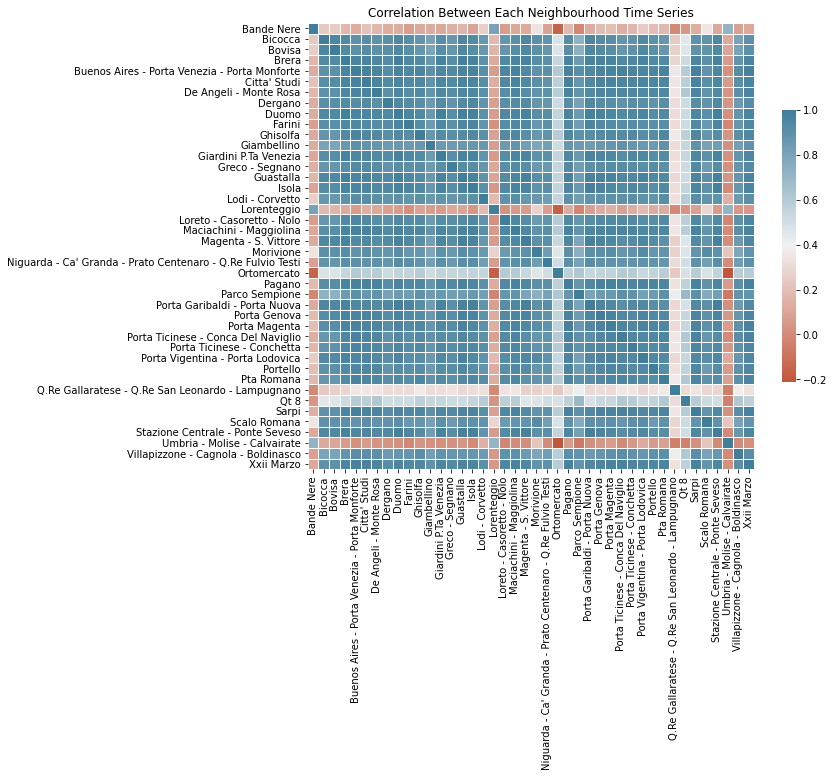

In [50]:
import seaborn as sns

pd.options.plotting.backend = "matplotlib"
%matplotlib inline

# to use pandas dtypes in matplotlib plots
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

fig, ax = plt.subplots(figsize=(10, 10))

sns.heatmap(
    nil_daily_rentals.corr(),
    ax=ax,
    square=True,
    cmap=sns.diverging_palette(20, 230, as_cmap=True),
    linewidths=0.5,
    cbar_kws={"shrink": 0.5},
).set(xlabel="", ylabel="", title="Correlation Between Each Neighbourhood Time Series");

Such a plot is already elegant, but we might want to explot some interactive plotting libraries to better explore the values:

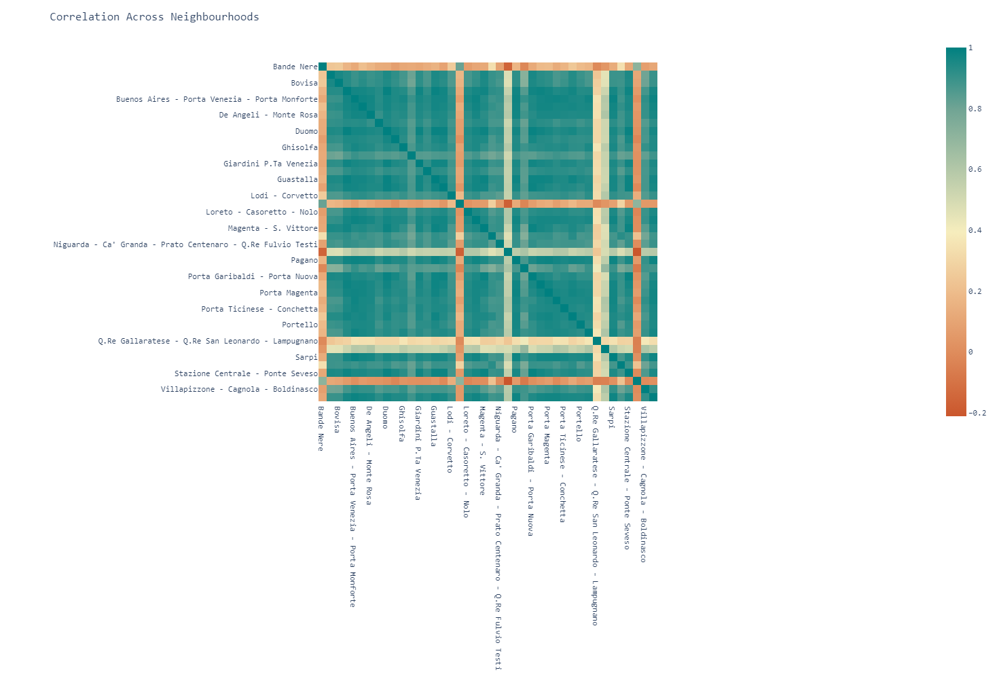

In [68]:
px.imshow(
    nil_daily_rentals.corr(),
    width=1000,
    height=1000,
    color_continuous_scale=px.colors.diverging.Geyser[::-1],
    labels={"x": "", "y": ""},
).update_layout(title_text="Correlation Across Neighbourhoods", font_family="Consolas")

These plots show that there are some stations that are totally uncorrelated with most of the others. We can obtain other insight from looking again at the geographical distribution of the data:

In [92]:
nil.head()

,nil,geometry
nil_number,,
17,Adriano,"POLYGON ((9.26729 45.51234, 9.26730 45.51236, ..."
80,Affori,"POLYGON ((9.17767 45.51899, 9.17729 45.51947, ..."
87,Assiano,"POLYGON ((9.04687 45.46276, 9.04685 45.46278, ..."
55,Baggio - Q.Re Degli Olmi - Q.Re Valsesia,"POLYGON ((9.09315 45.46938, 9.09285 45.47059, ..."
52,Bande Nere,"POLYGON ((9.12727 45.46894, 9.12613 45.46928, ..."


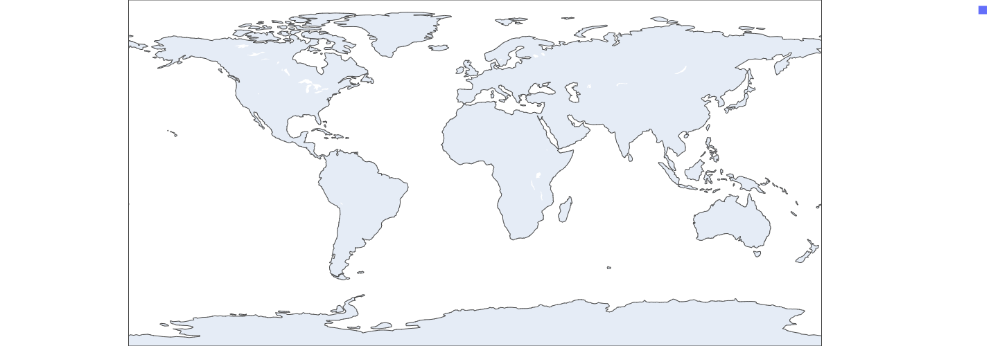

In [100]:
px.choropleth(
    nil,
    geojson=nil.geometry,
    locations=nil.nil,
    hover_name="nil",
    color_continuous_scale=px.colors.sequential.Plasma,
).update_layout(
    mapbox_style="open-street-map", height=500, margin={"r": 0, "t": 0, "l": 0, "b": 0}
)

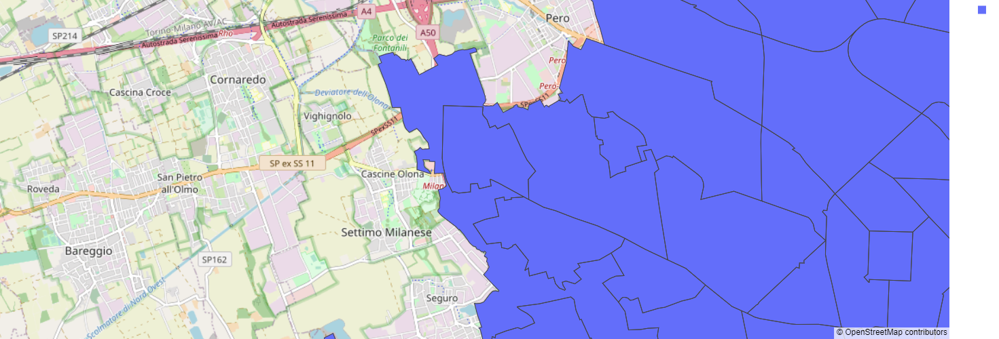

In [102]:
px.choropleth_mapbox(
    nil,
    geojson=nil.geometry,
    locations=nil.index,
    hover_name="nil",
    color_continuous_scale=px.colors.sequential.Plasma,
).update_layout(
    mapbox_style="open-street-map", height=500, margin={"r": 0, "t": 0, "l": 0, "b": 0}
).update_geos(
    projection=dict(type="eckert4")
)

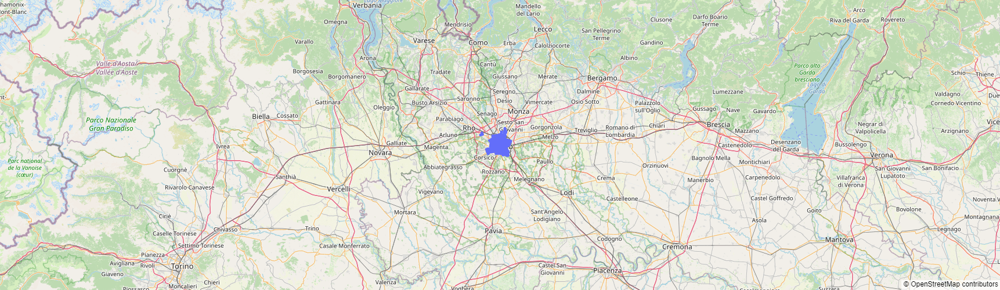

In [87]:
# good luck with the settings:
# https://plotly.com/python/reference/layout/geo/

px.scatter_mapbox(
    bikemi_stalls,
    lon=bikemi_stalls.geometry.x,
    lat=bikemi_stalls.geometry.y,
    hover_name=bikemi_stalls.reset_index()["nome"],
).update_layout(
    mapbox_style="open-street-map", height=500, margin={"r": 0, "t": 0, "l": 0, "b": 0}
).update_geos(
    projection=dict(type="eckert4")
)

# Save the Final Dataset

In [ ]:
nil_aggregated_outflow.to_csv("../data/bikemi_csv/nil_daily_outflow.csv")

# Appendix: Join with Municipi Data

Finally, we might want to have preserved the `municipio` information:

In [ ]:
nil_municipi = geopandas.sjoin(nil, municipi, how="inner", op="intersects")

In [ ]:
nil_municipi.head()

In [ ]:
nil_municipi = (
    nil_municipi[["nil", "MUNICIPIO", "geometry"]]
    .rename(
        columns={
            "nil": "nil_name",
            "MUNICIPIO": "municipio",
            "geometry": "geometry_municipio",
        }
    )
    .join(nil)
    .reset_index()
    .rename(columns={"geometry": "geometry_nil"})
    .drop("nil", axis=1)
)

The shape of the dataframe tells us that some `NIL` actually end un in multiple `Municipi`: for example, Brera spans across three!